This notebook performs a PCA for a subset of records, filtered by archiveType/paleoData_proxy.
For each subset, the following algorithm is being used:
 1. Filter archive_type and paleoData_proxy (defines subset) and produces summary plots of the data, in particular regarding: coverage, resolution and length of the records. This gives us information for the next step, in which we need to choose the parameters for the PCA
 2. Define proxy specific parameters for the PCA:
    - period (start and end year): choose a period of sufficient data density (all records chosen for the analysis need to at least overlap during this period)
    - minimum resolution: records exceeding this resolution are being excluded from the analysis. Records with higher resolution will be subsampled to create homogeneous resolution across all the records.
    - record length: records shorter than the record length are being excluded from the analysis. 
    - The choice of parameters will determine the success of the PCA. There is a trade-off between the number of records included and the quality (i.e. period/record length/resolution).
    - Summary figures are being produced for the filtered data
    - z-scores added to dataframe (mean=0 and std=1 over the entire record) as 'paleoData_zscores'
    - note: z-scores may be biased if records are only partly overlapping in time, or increase in availability over time, or both.
4. Homogenise data dimensions across the records
    - defines a homogenised time variable over the target period and with the target resolution (as defined in the last step), which is saved as a new column in the dataframe named 'years_hom'
    - creates a data matrix with dimensions n_records x n_time which is saved as a new column in df, named 'paleoData_values_hom' and 'paleoData_zscores_hom'.
    - Note that this data is formatted as a np.ma.masked_array, where missing data is set to zero and masked out. 
6. PCA
   - obtains covariance matrix of paleoData_zscores_hom (note that for every two records the covariance is calculated over their intersect of data availability)
   - obtains eigenvectors and eigenvalues via SVD composition
   - obtains and plots fraction of explained variance, first two PCs and load for first two EOFs vs ordering in the data frame. 

2025/01/08 v0: Outlined by Michael N. Evans for MT analysis; MT analysis notebook written by Lucie J. Luecke and modified for M analysis by LJL and MNE, 2025/01, 2025/02.

2025/02/07 v0: Notebook now includes summary figures at the end which plot results for different proxies on same axis and the global map of EOF loadings. Added documentation. 

2025/03/15 v0.3: MNE cleaned up for M analysis only (some archiveTypes do not have enough M-only data to continue; these are commented out).  -1 multiplier on the summary PC plotting eliminated because these are presumably proxies of precipitation or moisture d18O, not ice volume indicators. 


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature 
from matplotlib.gridspec import GridSpec as GS
import scipy.io as sio
from copy import deepcopy as dc

In [3]:
# choose working directory
wdir = os.curdir
os.chdir(wdir)
print(wdir)
import functions as f # contains functions for data processing, plotting etc.
import f_analysis as fan # contains functions for data analysis

.


In [4]:
# read dataframe 
# e.g. PAGES2k but works with any dataframe as long as notation is followed

db_name = 'dod2k_dupfree_dupfree_M'

# load dataframe
df = f.load_compact_dataframe_from_csv(db_name)

print(df.originalDatabase.unique())

df.name = db_name

archive_colour, archives_sorted, proxy_marker  = fan.df_colours_markers()

['FE23 (Breitenmoser et al. (2014))' 'dod2k_composite_standardised'
 'Iso2k v1.0.1']
0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 bivalve 1
13 hybrid 1


In [5]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1073 entries, 0 to 1072
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   archiveType                           1073 non-null   object 
 1   climateInterpretation_variable        1073 non-null   object 
 2   climateInterpretation_variableDetail  1073 non-null   object 
 3   dataSetName                           1073 non-null   object 
 4   datasetId                             1073 non-null   object 
 5   duplicateDetails                      1073 non-null   object 
 6   geo_meanElev                          1068 non-null   float32
 7   geo_meanLat                           1073 non-null   float32
 8   geo_meanLon                           1073 non-null   float32
 9   geo_siteName                          1073 non-null   object 
 10  originalDataURL                       1073 non-null   object 
 11  originalDatabase 

## spatial distribution

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 bivalve 1
13 hybrid 1
saved figure in /dod2k_dupfree_dupfree_M/figs///M_spatial.pdf


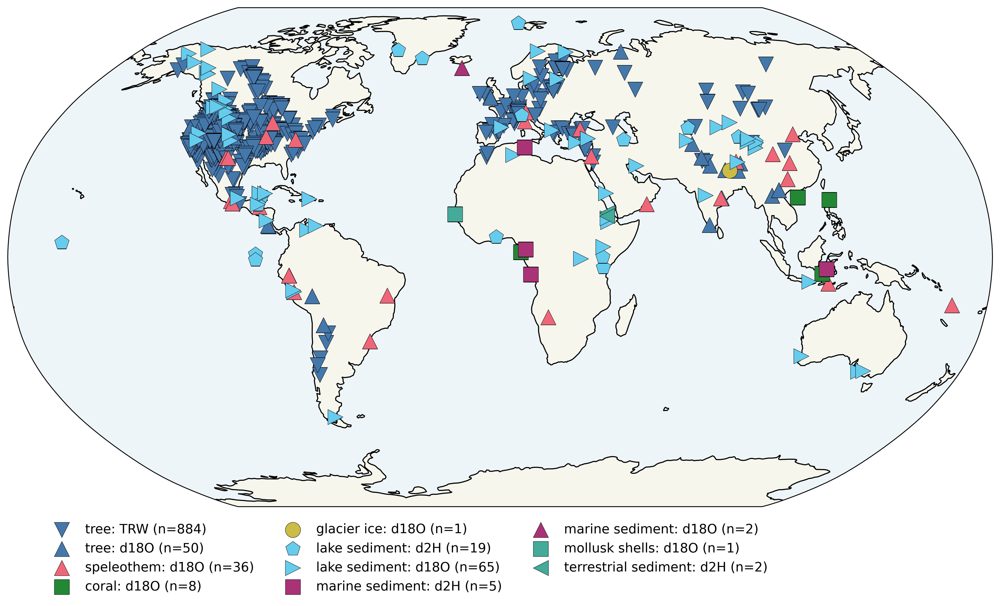

In [6]:
fig = fan.geo_plot(df, fs=(13,8))

# There is a bug in this figure due to lake sediments not being bolded!!

f.figsave(fig, 'M_spatial', addfigs='/%s/figs/'%df.name)

# data analysis

In [7]:
time    = {}
data    = {}
PCs     = {}
EOFs    = {}
foev    = {}
pca_rec = {}

keys    = []

## tree TRW

### filter archive_type and paleoData_proxy

n_records   :  884
archive type:  {'tree'}
proxy type:    {'TRW'}


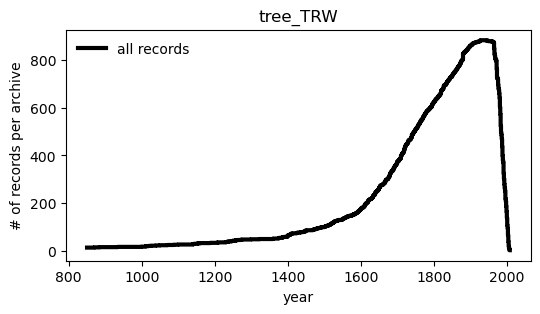

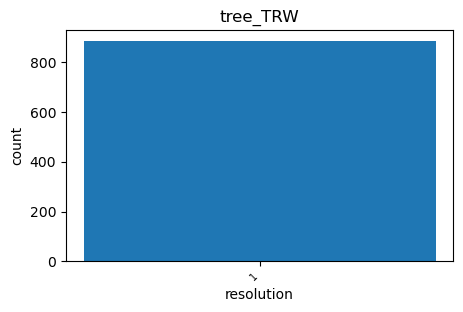

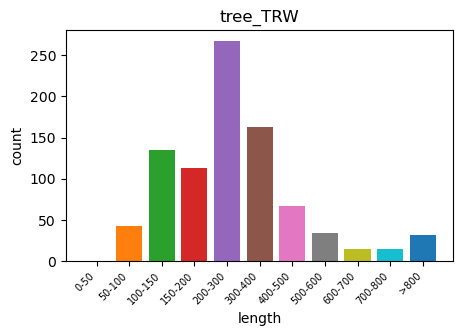

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 bivalve 1
13 hybrid 1


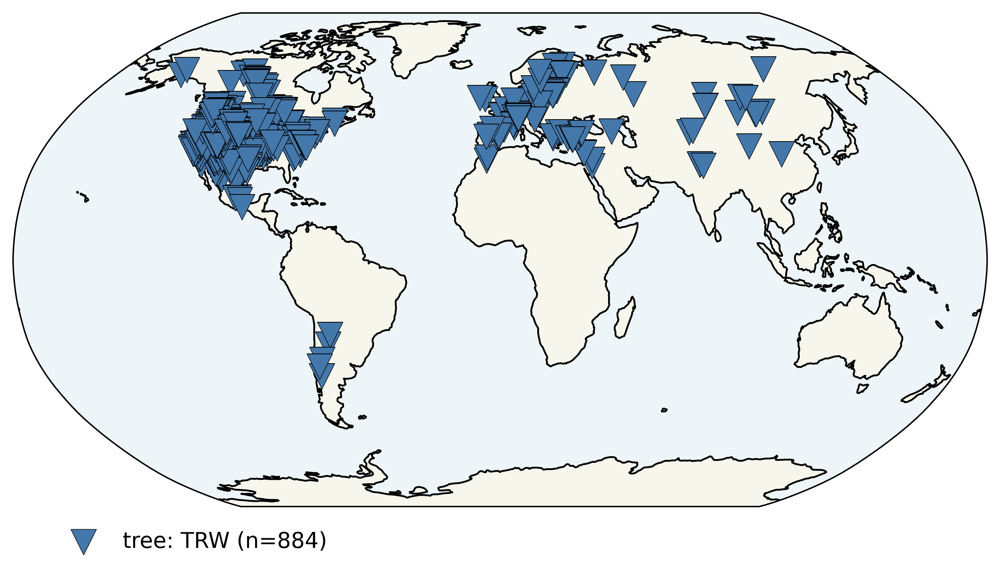

In [8]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'tree'
pt = 'TRW'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key)

# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 61 records with nyears>=600 during 1000-2000. Exclude 823 records.
Keep 61 records with resolution <=1. Exclude 0 records.


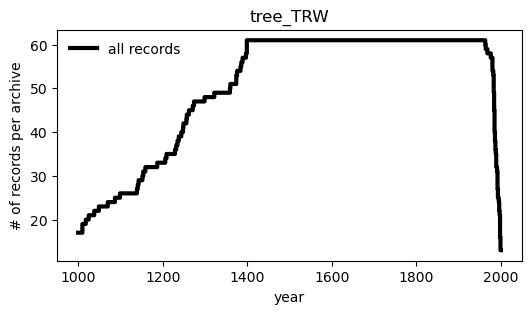

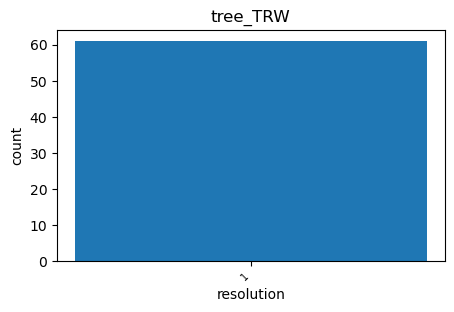

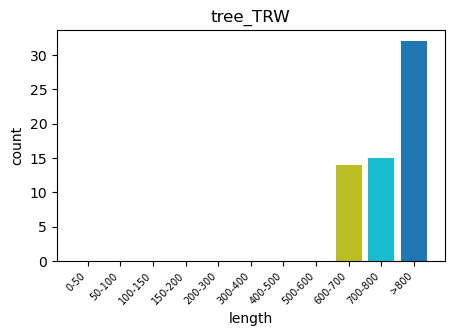

       miny    maxy                   originalDatabase
0    1360.0  1983.0  FE23 (Breitenmoser et al. (2014))
3     935.0  1993.0  FE23 (Breitenmoser et al. (2014))
90   1153.0  1986.0  FE23 (Breitenmoser et al. (2014))
216  1155.0  1985.0  FE23 (Breitenmoser et al. (2014))
217  1230.0  1980.0  FE23 (Breitenmoser et al. (2014))
..      ...     ...                                ...
824   850.0  1985.0  FE23 (Breitenmoser et al. (2014))
825   850.0  1989.0  FE23 (Breitenmoser et al. (2014))
829  1390.0  1998.0  FE23 (Breitenmoser et al. (2014))
841  1236.0  1984.0  FE23 (Breitenmoser et al. (2014))
870  1377.0  1999.0  FE23 (Breitenmoser et al. (2014))

[61 rows x 3 columns]


In [9]:
#========================= PROXY SPECIFIC=========================
minres    = 1                         # homogenised resolution
mny       = 1000                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([600, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

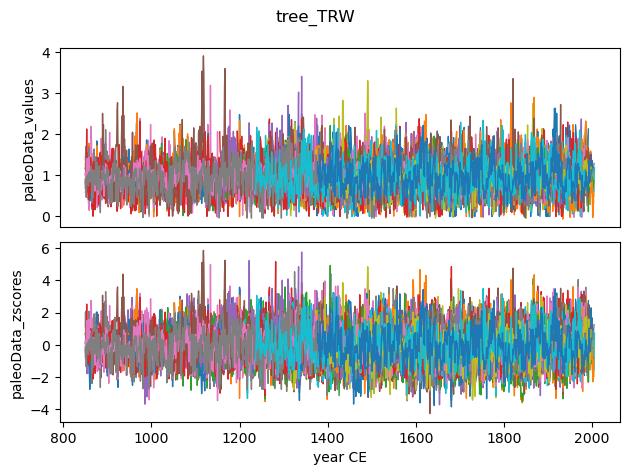

In [10]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [11]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom

Homogenised time coordinate: 1000-2000 CE
Resolution: [1] years
INTERSECT: 1400-1963


(61, 1001)
Real intersect after homogenising resolution: 
INTERSECT: 1400-1963


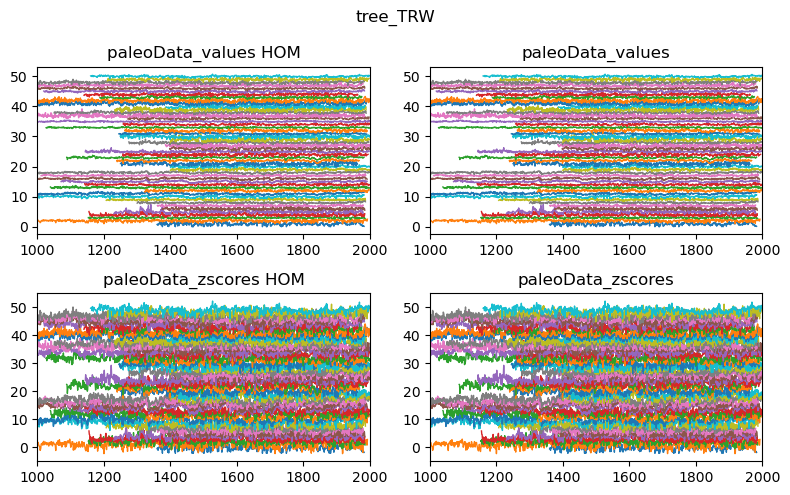

In [12]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')
data[key] = paleoData_zscores_hom


### PCA

In [13]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  []


saved figure in /figs/dod2k_dupfree_dupfree_M/foev_tree_TRW.pdf


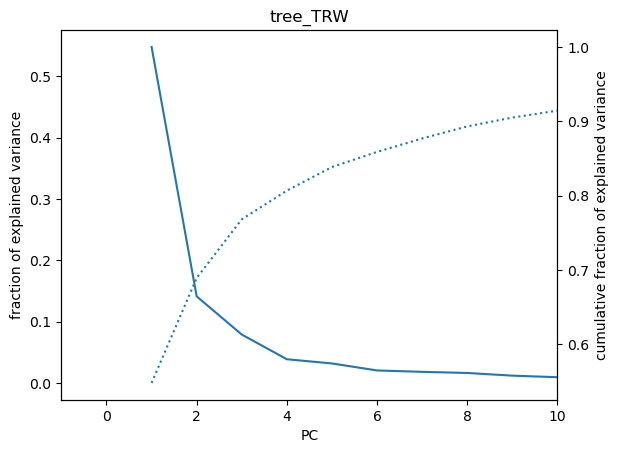

In [14]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)

saved figure in /figs/dod2k_dupfree_dupfree_M/PCs_tree_TRW.pdf
saved figure in /figs/dod2k_dupfree_dupfree_M/EOFloading_tree_TRW.pdf


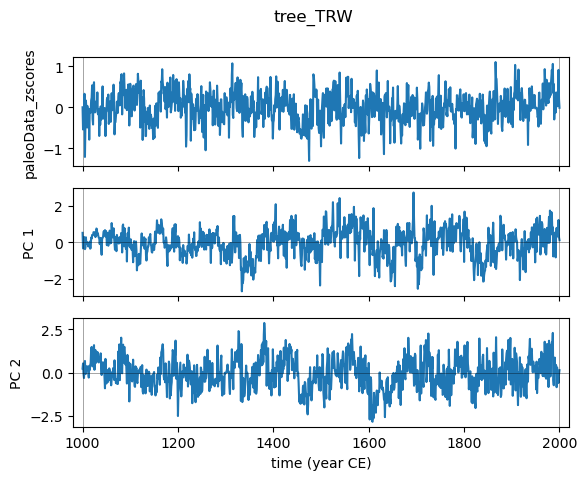

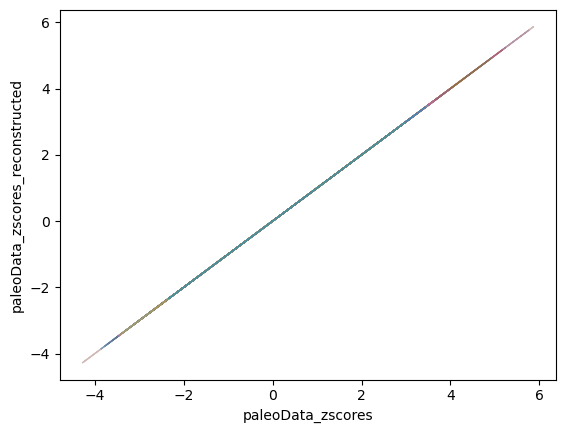

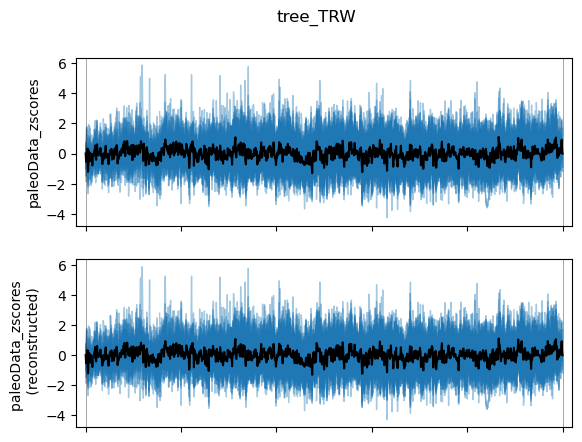

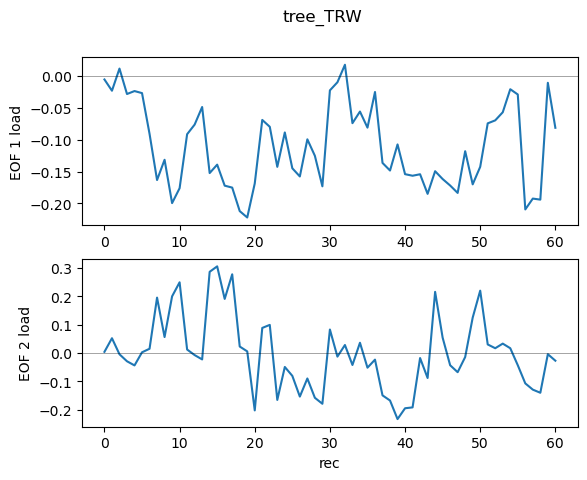

In [15]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [16]:
print('Finished for %s'%key)

Finished for tree_TRW


## tree d18O

### filter archive_type and paleoData_proxy

n_records   :  50
archive type:  {'tree'}
proxy type:    {'d18O'}


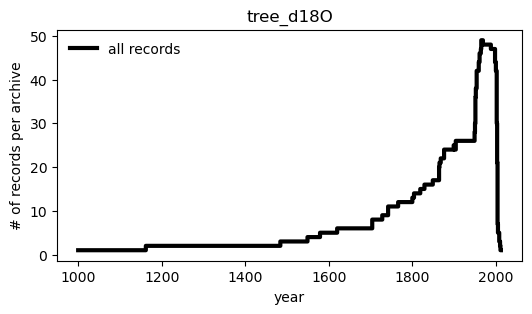

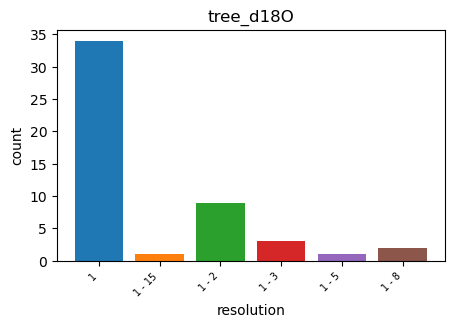

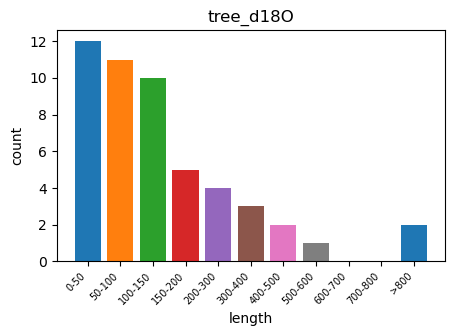

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 bivalve 1
13 hybrid 1


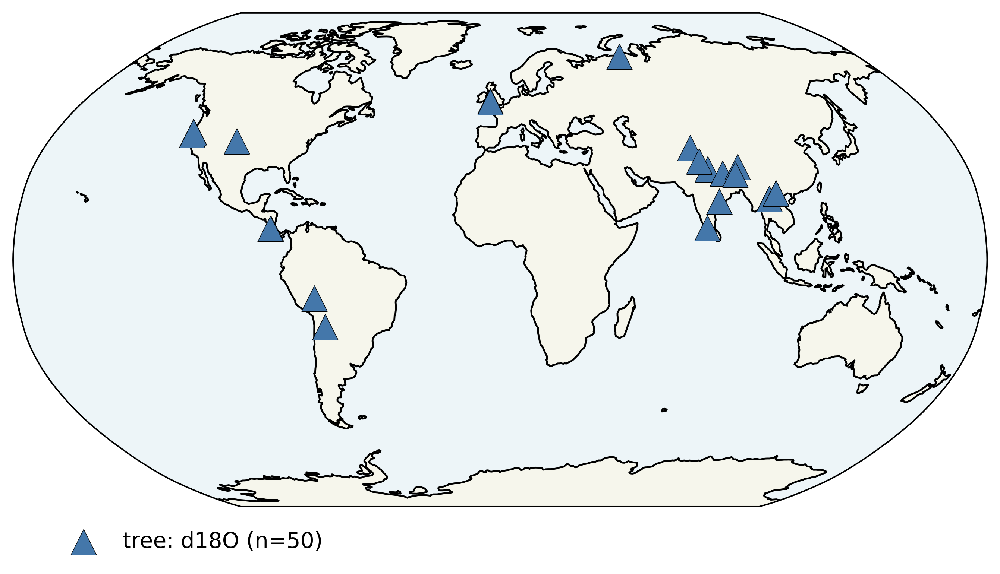

In [17]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'tree'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)


### filter for target period, resolution and minimum record length

Keep 30 records with nyears>=50 during 1700-2000. Exclude 20 records.
Keep 23 records with resolution <=2. Exclude 7 records.


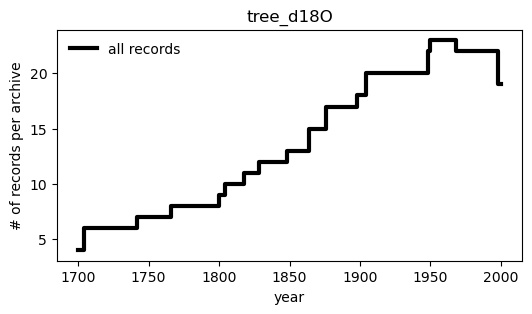

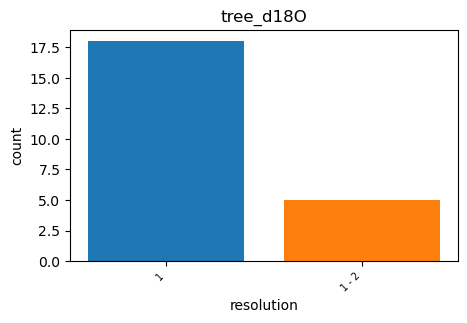

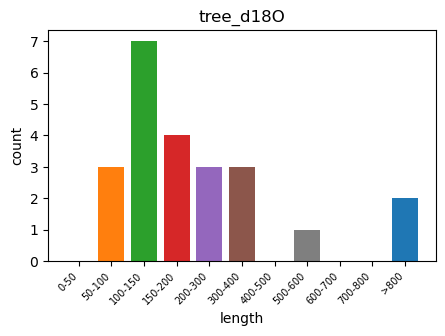

        miny    maxy originalDatabase
1010  1000.0  1998.0     Iso2k v1.0.1
1011  1865.0  1969.0     Iso2k v1.0.1
1012  1900.0  2002.0     Iso2k v1.0.1
1013  1820.0  2004.0     Iso2k v1.0.1
1014  1865.0  2004.0     Iso2k v1.0.1
1015  1877.0  1998.0     Iso2k v1.0.1
1016  1877.0  1998.0     Iso2k v1.0.1
1025  1951.0  2002.0     Iso2k v1.0.1
1026  1805.0  2004.0     Iso2k v1.0.1
1027  1705.0  2004.0     Iso2k v1.0.1
1028  1905.0  2004.0     Iso2k v1.0.1
1029  1905.0  2004.0     Iso2k v1.0.1
1030  1705.0  2004.0     Iso2k v1.0.1
1031  1830.0  2010.0     Iso2k v1.0.1
1032  1850.0  2012.0     Iso2k v1.0.1
1033  1621.0  2008.0     Iso2k v1.0.1
1038  1767.0  2008.0     Iso2k v1.0.1
1040  1801.0  2000.0     Iso2k v1.0.1
1042  1950.0  2003.0     Iso2k v1.0.1
1046  1163.0  2005.0     Iso2k v1.0.1
1055  1485.0  2005.0     Iso2k v1.0.1
1056  1743.0  2011.0     Iso2k v1.0.1
1071  1950.0  2003.0     Iso2k v1.0.1


In [18]:
#========================= PROXY SPECIFIC=========================
minres    = 2                         # homogenised resolution
mny       = 1700                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([50, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

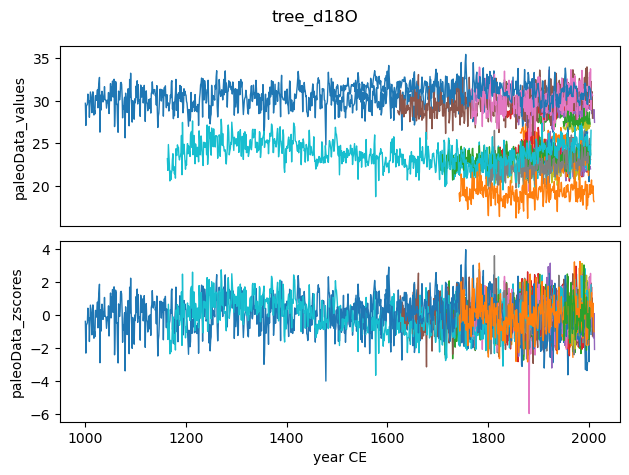

In [19]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [20]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


Homogenised time coordinate: 1700-2000 CE
Resolution: [2] years
INTERSECT: 1951-1969


(23, 151)
Real intersect after homogenising resolution: 
INTERSECT: 1952-1970


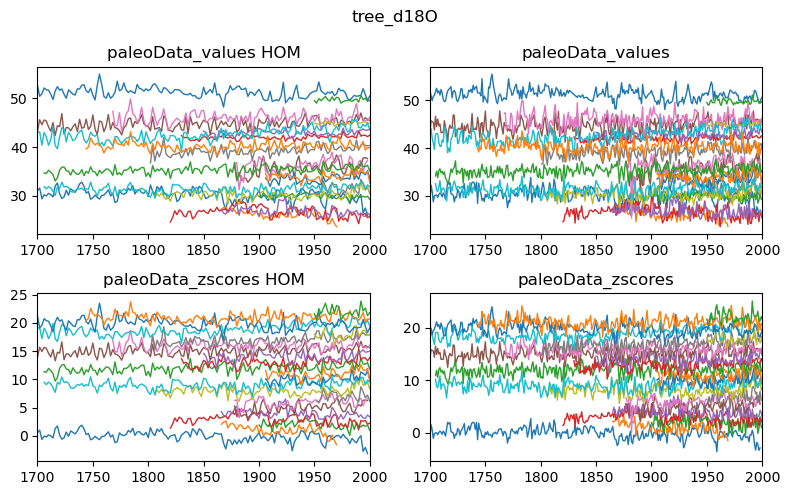

In [21]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


In [22]:
paleoData_values_hom.shape

(23, 151)

### PCA

In [23]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  [24. 25. 25. 36. 10. 33. 33. 11. 11. 36. 25. 26. 26. 25. 26. 26. 25. 26.
 26. 24. 25. 25. 24. 25. 25. 24. 10. 25. 25. 25. 24. 24. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 26. 26. 25. 26. 26.
 33. 25. 26. 26. 33. 25. 26. 26. 25. 26. 26. 25. 26. 26. 25. 26. 26. 25.
 26. 26. 25. 26. 26. 25. 26. 26. 25. 11. 26. 26. 26. 25. 25. 25. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 25. 26. 26. 25. 26.
 26. 25. 26. 26. 25. 11. 26. 26. 26. 25. 25. 25. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26.]


In [24]:
covariance.shape

(23, 23)

saved figure in /figs/dod2k_dupfree_dupfree_M/foev_tree_d18O.pdf


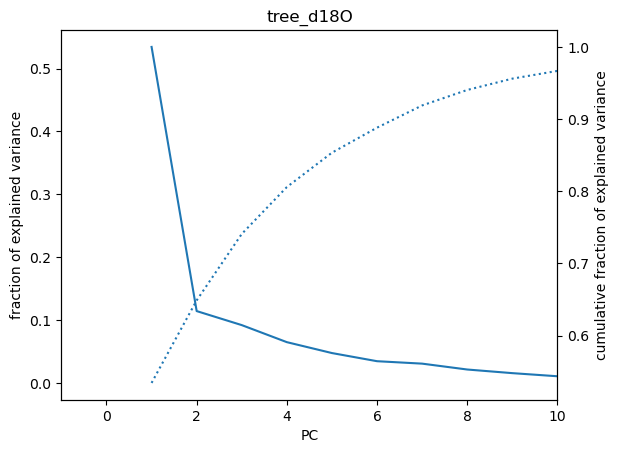

In [25]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [26]:
eigenvectors.shape

(23, 23)

saved figure in /figs/dod2k_dupfree_dupfree_M/PCs_tree_d18O.pdf
saved figure in /figs/dod2k_dupfree_dupfree_M/EOFloading_tree_d18O.pdf


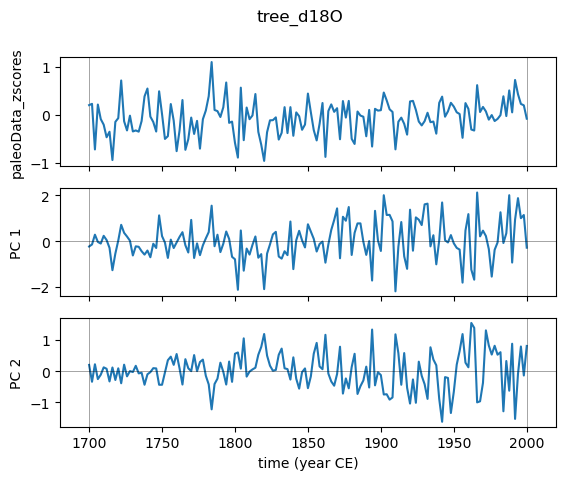

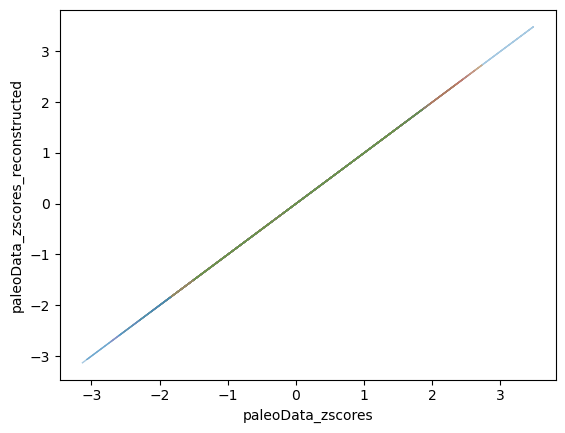

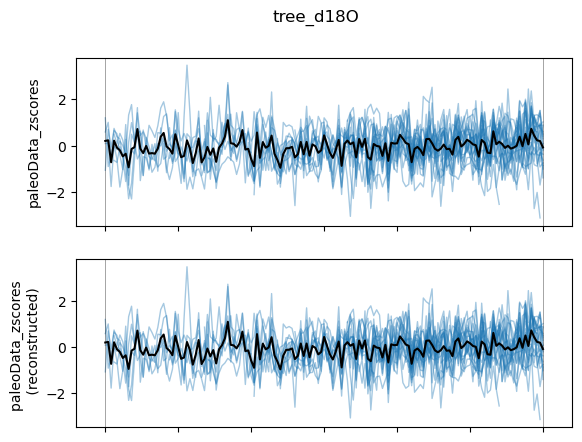

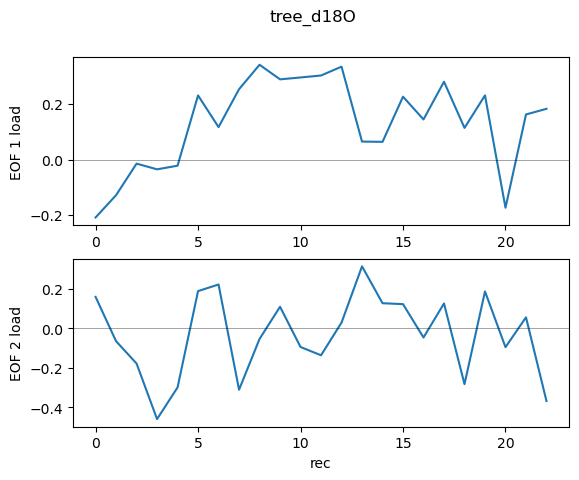

In [27]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [28]:
PCs[key].shape

(23, 151)

In [29]:
print('Finished for %s'%key)
# raise Exception

Finished for tree_d18O


## coral d18O

### filter archive_type and paleoData_proxy

n_records   :  8
archive type:  {'coral'}
proxy type:    {'d18O'}


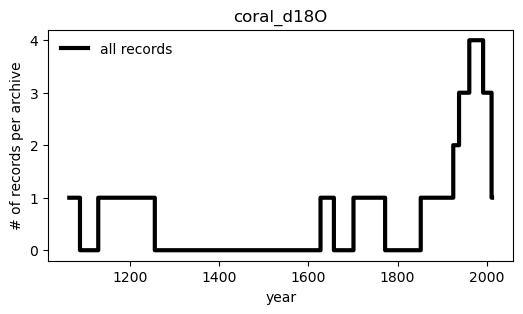

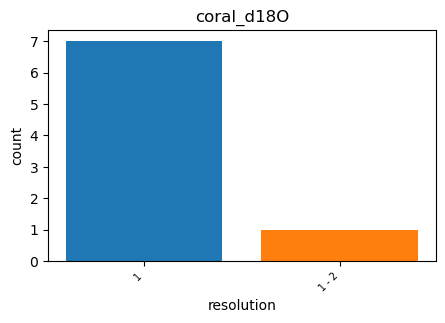

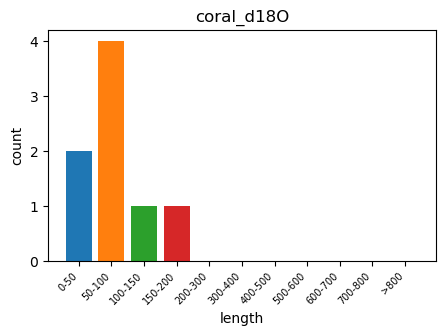

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 bivalve 1
13 hybrid 1


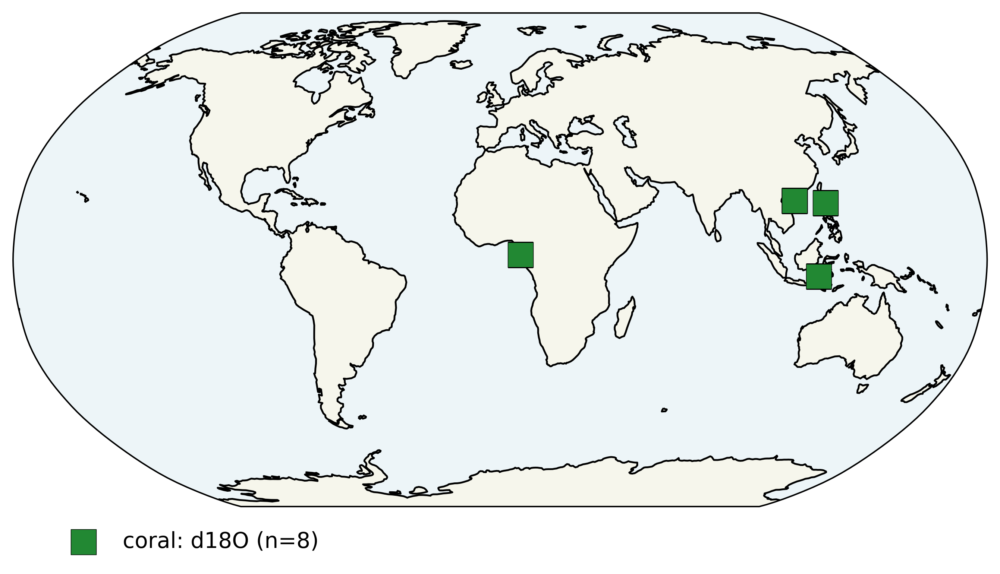

In [30]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'coral'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 1 records with nyears>=90 during 1750-2000. Exclude 7 records.
Keep 1 records with resolution <=1. Exclude 0 records.


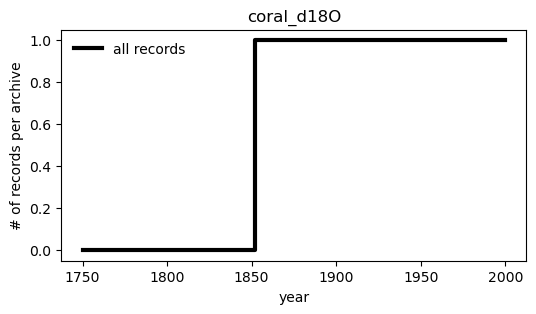

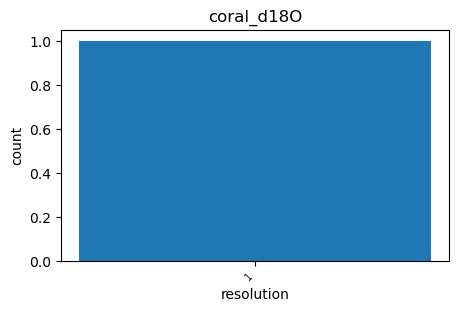

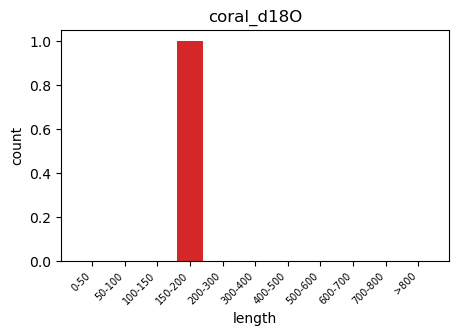

        miny    maxy originalDatabase
1039  1853.0  2011.0     Iso2k v1.0.1


In [31]:
#========================= PROXY SPECIFIC=========================
minres    = 1                         # homogenised resolution
mny       = 1750                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([90, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

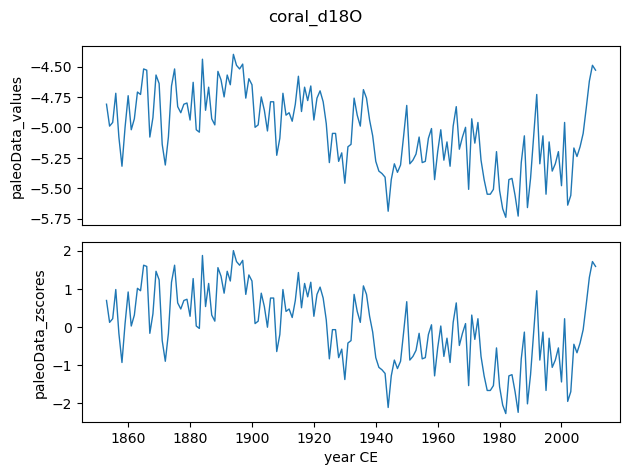

In [32]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [33]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


Homogenised time coordinate: 1750-2000 CE
Resolution: [1] years
INTERSECT: 1853-2011


(1, 251)
Real intersect after homogenising resolution: 
INTERSECT: 1853-2000


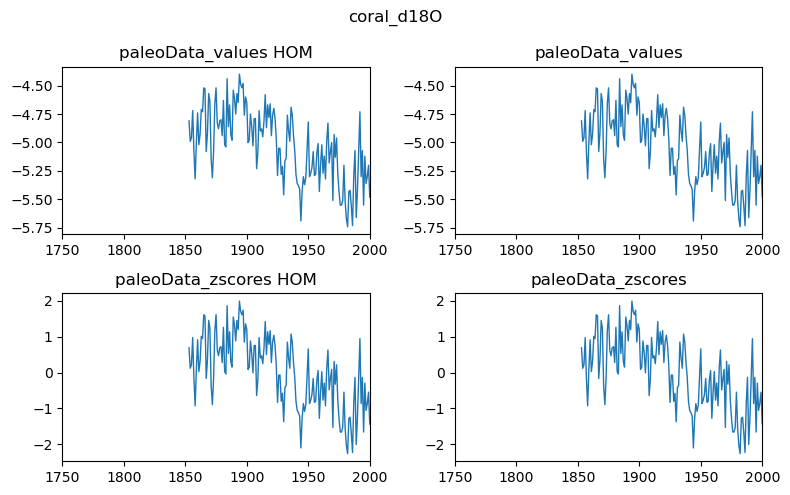

In [34]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


### PCA

In [35]:
#covariance, overlap = fan.calc_covariance_matrix(df_proxy)

In [36]:
#eigenvalues, eigenvectors = fan.PCA(covariance)

#foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [37]:
#paleoData_zscores_hom.shape

In [38]:
#PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [39]:
#print('Finished for %s'%key)

## speleothem d18O

### filter archive_type and paleoData_proxy

n_records   :  36
archive type:  {'speleothem'}
proxy type:    {'d18O'}


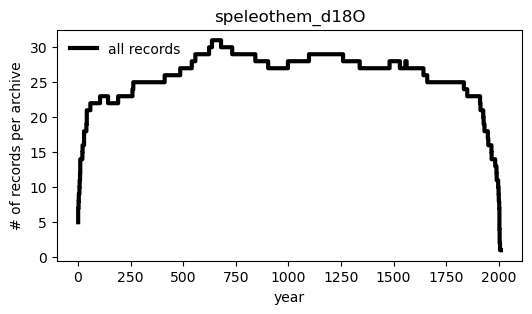

25 - 300  <350
1 - 150  <250
40 - 107  <150
1 - 88   <95
14 - 40   <45
14 - 69   <75
24 - 49   <55
10 - 34   <35
1 - 15   <25
4 - 80   <85
1 - 13   <15
1    <5


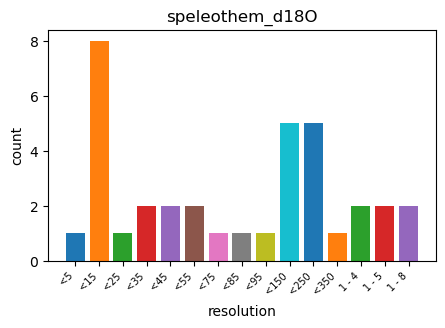

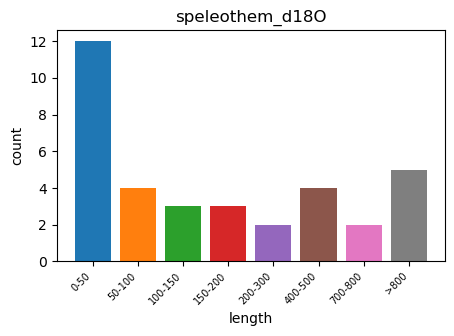

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 bivalve 1
13 hybrid 1


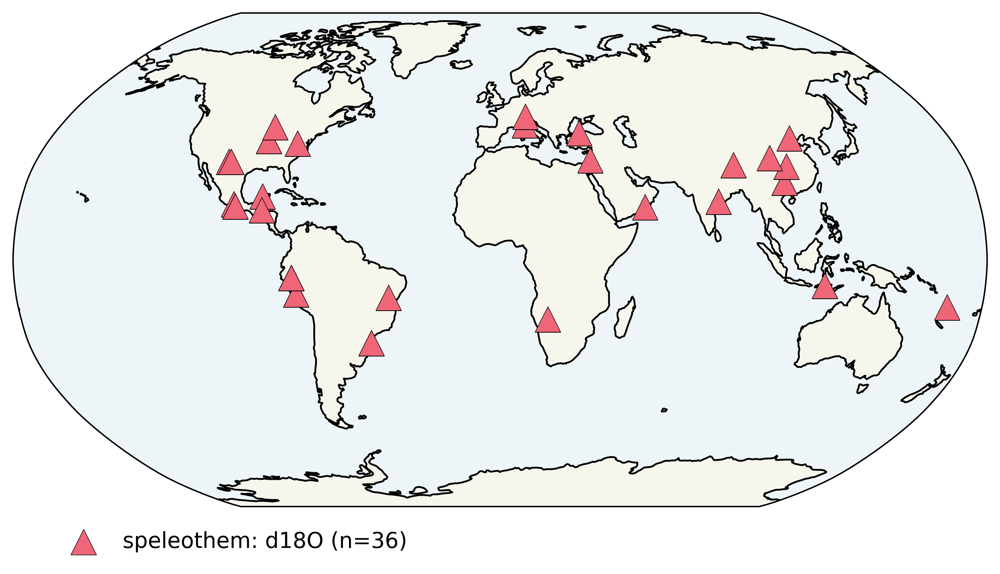

In [40]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'speleothem'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key, mincount=2)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 11 records with nyears>=200 during 500-1600. Exclude 25 records.
Keep 11 records with resolution <=55. Exclude 0 records.


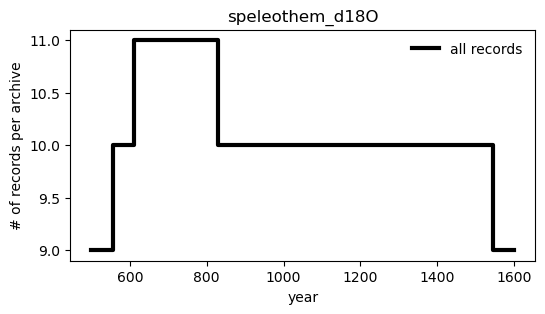

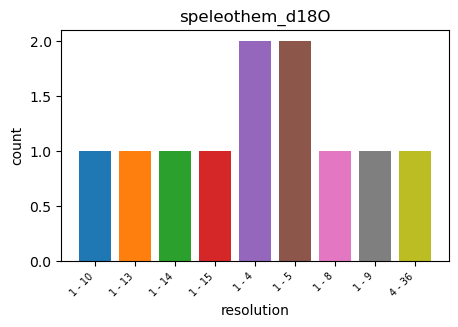

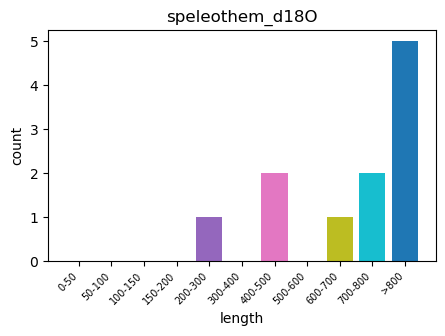

       miny    maxy originalDatabase
983     2.0  2002.0     Iso2k v1.0.1
986   192.0  2003.0     Iso2k v1.0.1
989   624.0  1562.0     Iso2k v1.0.1
990   487.0  2004.0     Iso2k v1.0.1
992     1.0  1997.0     Iso2k v1.0.1
994     1.0  2003.0     Iso2k v1.0.1
995     1.0  2010.0     Iso2k v1.0.1
996     2.0  1911.0     Iso2k v1.0.1
1000  559.0  1983.0     Iso2k v1.0.1
1001    1.0   843.0     Iso2k v1.0.1
1002    1.0  1999.0     Iso2k v1.0.1


In [41]:
#========================= PROXY SPECIFIC=========================
minres    = 55                         # homogenised resolution
mny       = 500                      # start year of homogenised time coord
mxy       = 1600                      # end year of homogenised time coord
nyears    = np.min([200, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

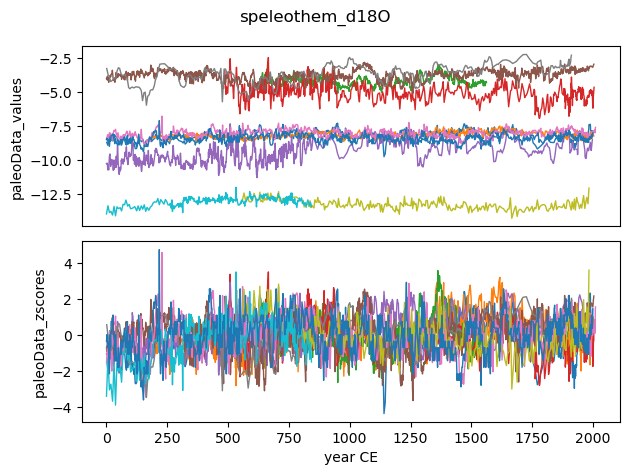

In [42]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

Homogenised time coordinate: 500-1600 CE
Resolution: [55] years
No shared period across all records.


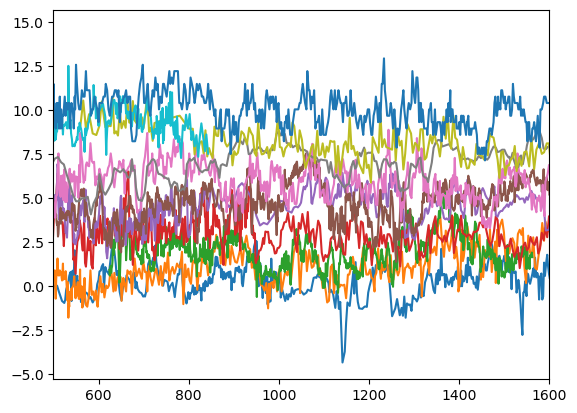

In [43]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


(11, 21)
Real intersect after homogenising resolution: 
INTERSECT: 665-885


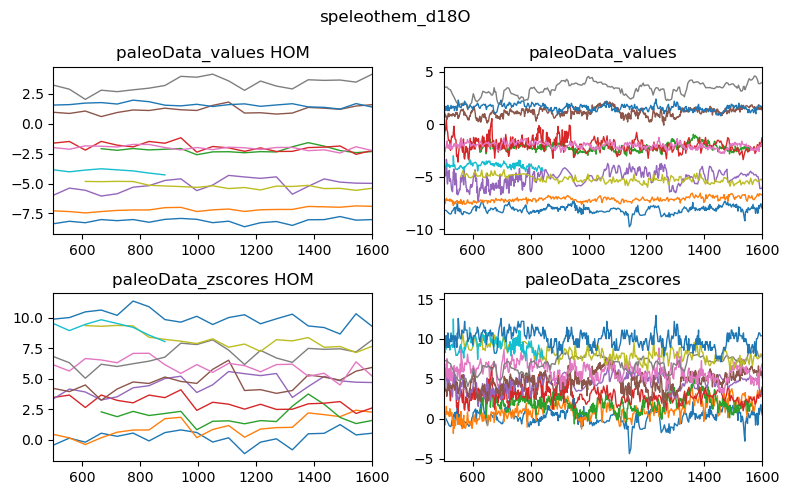

In [44]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


### PCA

In [45]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  [21. 21. 18. 21. 21. 21. 21. 21. 19.  8. 21. 21. 21. 18. 21. 21. 21. 21.
 21. 19.  8. 21. 18. 18. 18. 18. 18. 18. 18. 18. 18.  5. 18. 21. 21. 18.
 21. 21. 21. 21. 21. 19.  8. 21. 21. 21. 18. 21. 21. 21. 21. 21. 19.  8.
 21. 21. 21. 18. 21. 21. 21. 21. 21. 19.  8. 21. 21. 21. 18. 21. 21. 21.
 21. 21. 19.  8. 21. 21. 21. 18. 21. 21. 21. 21. 21. 19.  8. 21. 19. 19.
 18. 19. 19. 19. 19. 19. 19.  6. 19.  8.  8.  5.  8.  8.  8.  8.  8.  6.
  8.  8. 21. 21. 18. 21. 21. 21. 21. 21. 19.  8. 21.]


saved figure in /figs/dod2k_dupfree_dupfree_M/foev_speleothem_d18O.pdf


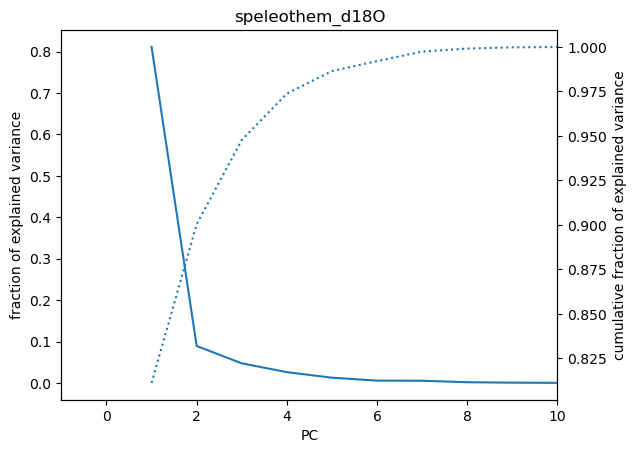

In [46]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


saved figure in /figs/dod2k_dupfree_dupfree_M/PCs_speleothem_d18O.pdf
saved figure in /figs/dod2k_dupfree_dupfree_M/EOFloading_speleothem_d18O.pdf


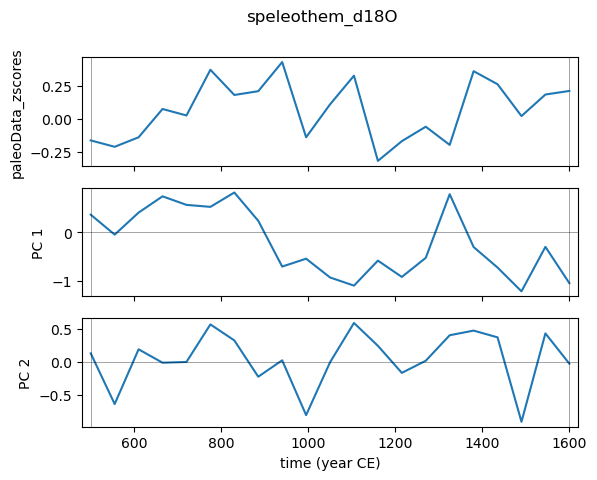

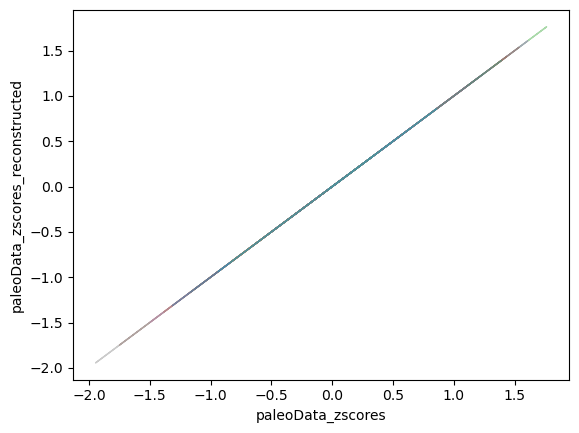

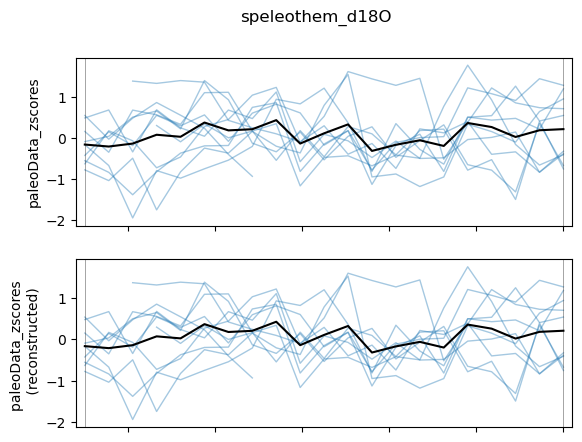

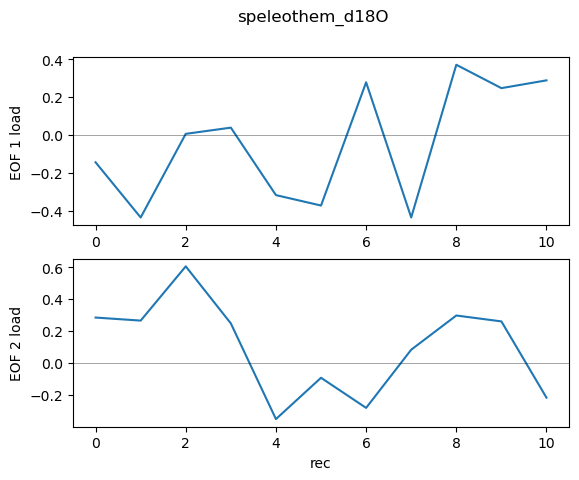

In [47]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [48]:
print('Finished for %s'%key)

Finished for speleothem_d18O


## lake sediment d18O + d2H

### filter archive_type and paleoData_proxy

n_records   :  84
archive type:  {'lake sediment'}
proxy type:    {'d2H', 'd18O'}


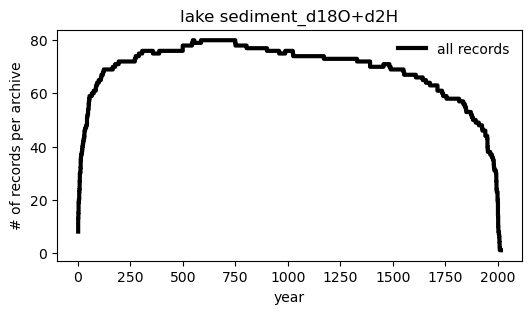

10 - 90   <95
1 - 40   <45
11 - 106  <150
28 - 324  <350
1 - 12   <15
8 - 70   <75
92 - 393  <450
7 - 33   <35
30 - 199  <250
3 - 18   <25
3 - 55   <65
6 - 52   <55
1 - 5    <5
128 - 521  <550
25 - 616  <650
3 - 75   <85


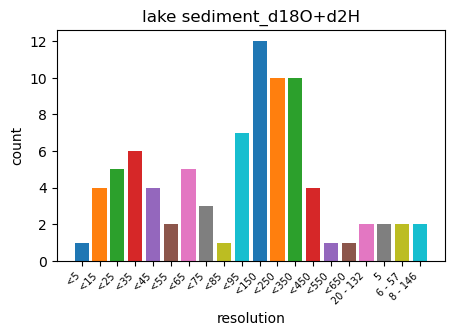

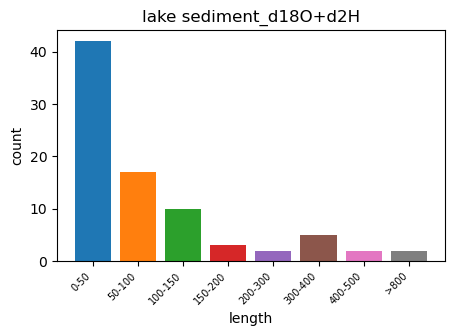

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 bivalve 1
13 hybrid 1


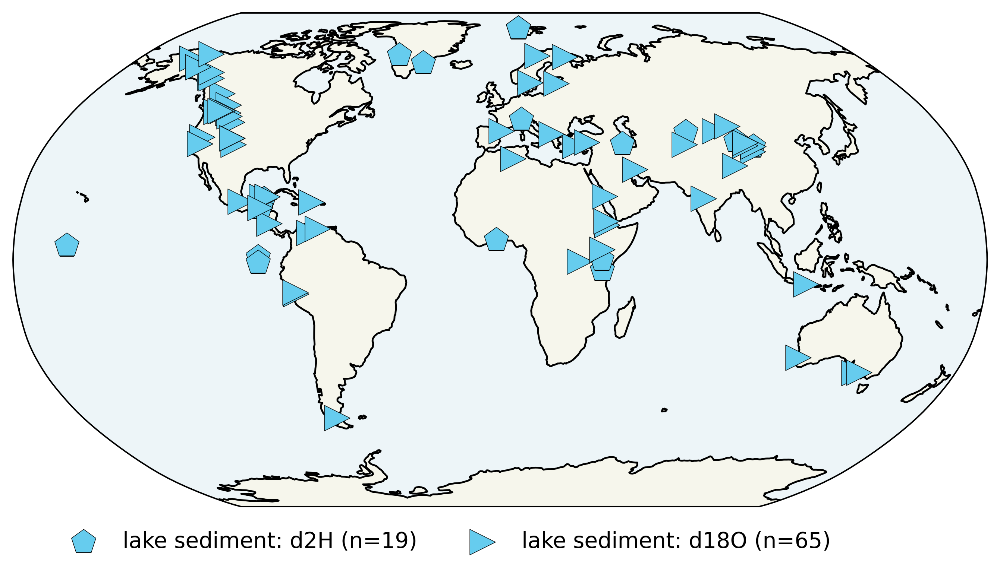

In [49]:
# (1) filter for archiveType and/or paleoData_proxy: 
at  = 'lake sediment'
pt  = 'd18O+d2H'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt.split('+')[0])|(df['paleoData_proxy']==pt.split('+')[1])]

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key, mincount=2)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 8 records with nyears>=200 during 500-1600. Exclude 76 records.
Keep 8 records with resolution <=55. Exclude 0 records.


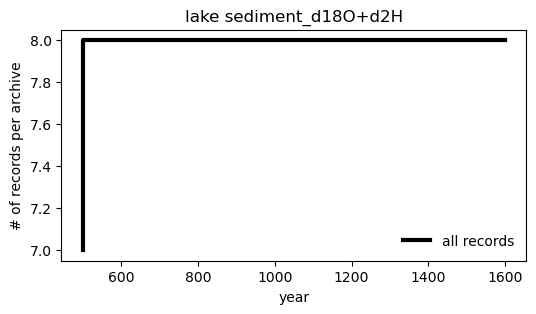

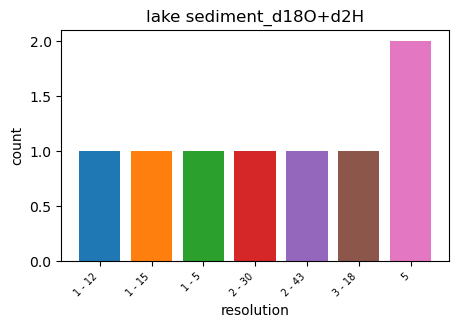

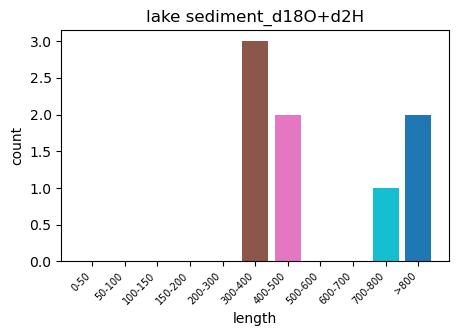

      miny    maxy originalDatabase
890    2.0  2009.0     Iso2k v1.0.1
898  544.0  1980.0     Iso2k v1.0.1
905  276.0  2001.0     Iso2k v1.0.1
927    2.0  2007.0     Iso2k v1.0.1
935  500.0  2000.0     Iso2k v1.0.1
936  500.0  2000.0     Iso2k v1.0.1
940    3.0  1609.0     Iso2k v1.0.1
960    8.0  1998.0     Iso2k v1.0.1


In [50]:
#========================= PROXY SPECIFIC=========================
minres    = 55                         # homogenised resolution
mny       = 500                      # start year of homogenised time coord
mxy       = 1600                      # end year of homogenised time coord
nyears    = np.min([200, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

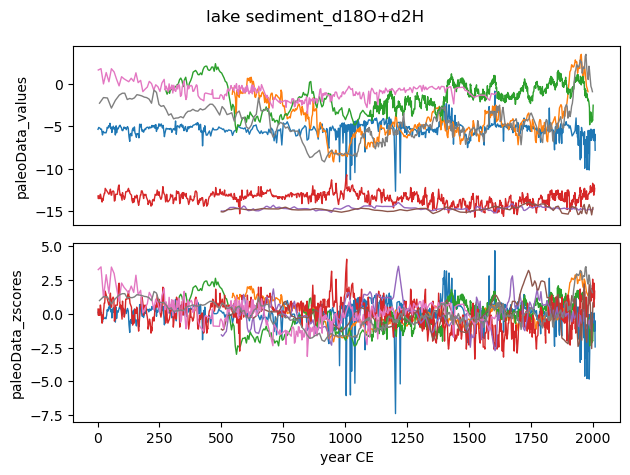

In [51]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)

### homogenise data dimensions across the records

Homogenised time coordinate: 500-1600 CE
Resolution: [55] years
No shared period across all records.


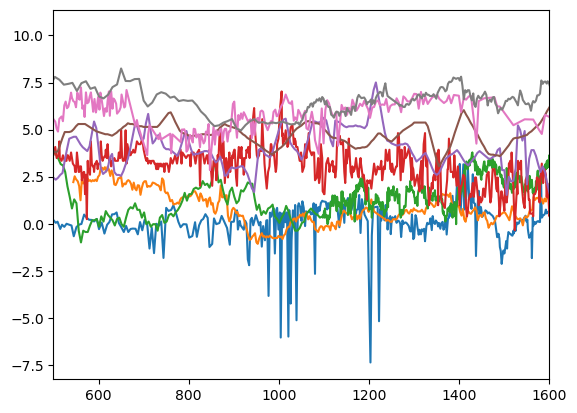

In [52]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


(8, 21)
Real intersect after homogenising resolution: 
INTERSECT: 555-1600


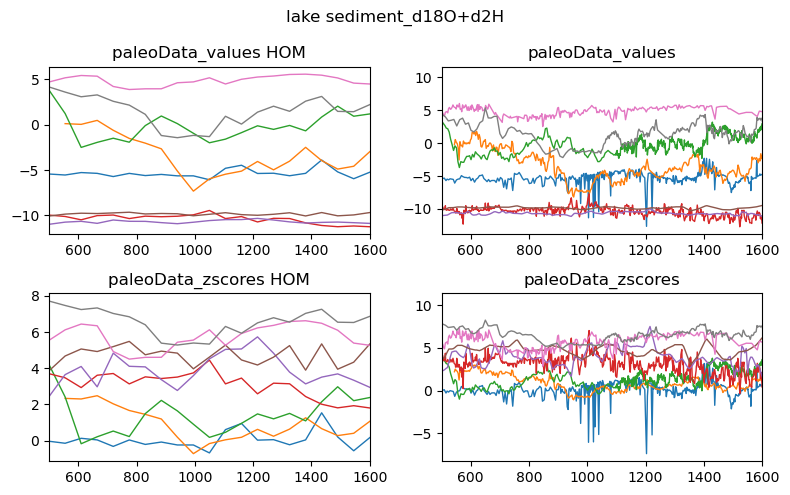

In [53]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


### PCA

In [54]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  [21. 20. 21. 21. 21. 21. 21. 21. 20. 20. 20. 20. 20. 20. 20. 20. 21. 20.
 21. 21. 21. 21. 21. 21. 21. 20. 21. 21. 21. 21. 21. 21. 21. 20. 21. 21.
 21. 21. 21. 21. 21. 20. 21. 21. 21. 21. 21. 21. 21. 20. 21. 21. 21. 21.
 21. 21. 21. 20. 21. 21. 21. 21. 21. 21.]


saved figure in /figs/dod2k_dupfree_dupfree_M/foev_lake sediment_d18O+d2H.pdf


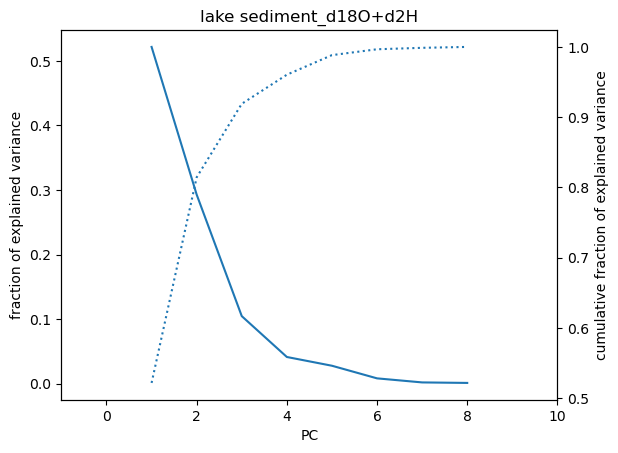

In [55]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


saved figure in /figs/dod2k_dupfree_dupfree_M/PCs_lake sediment_d18O+d2H.pdf
saved figure in /figs/dod2k_dupfree_dupfree_M/EOFloading_lake sediment_d18O+d2H.pdf


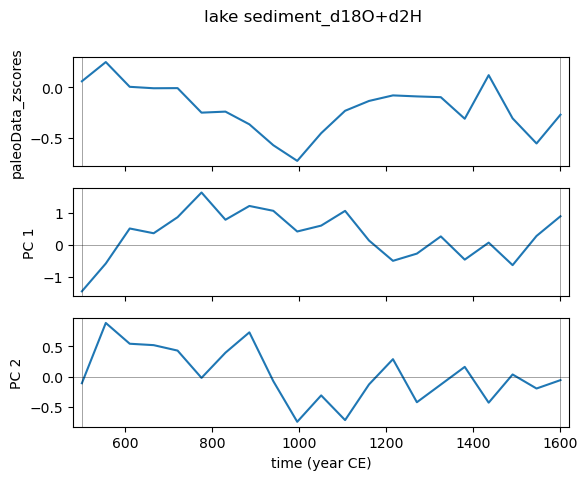

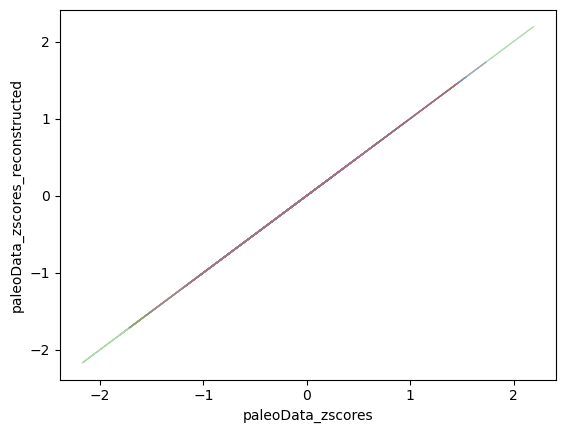

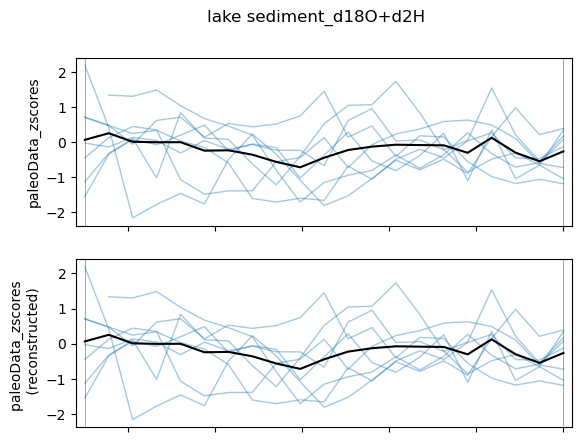

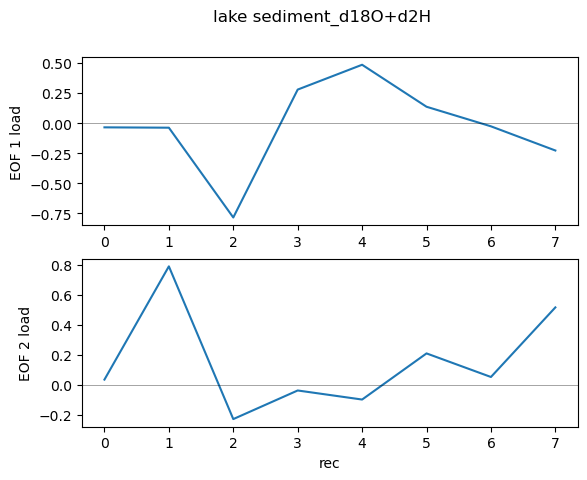

In [56]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [57]:
print('Finished for %s'%key)

Finished for lake sediment_d18O+d2H


## marine sediment d18O

### filter archive_type and paleoData_proxy

n_records   :  2
archive type:  {'marine sediment'}
proxy type:    {'d18O'}


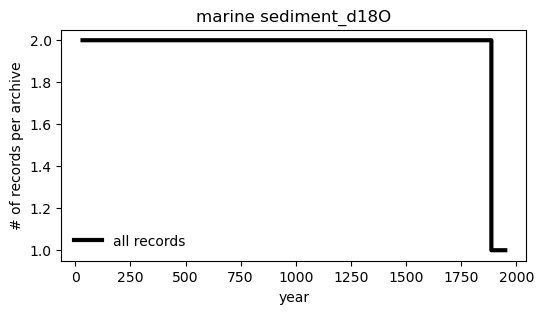

60 - 136  <150


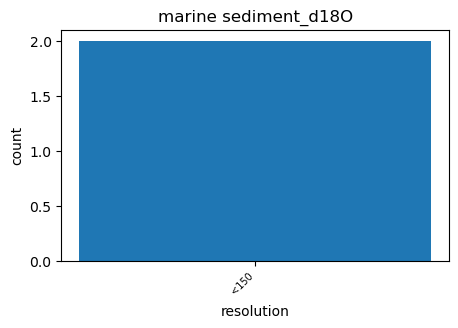

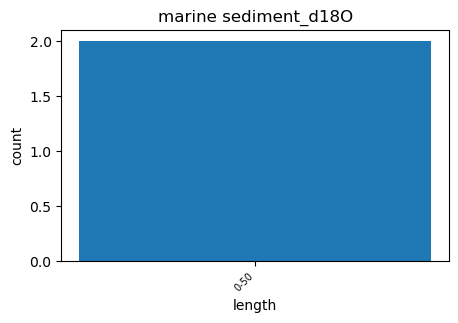

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 lake sediment 151
5 marine sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 bivalve 1
13 hybrid 1


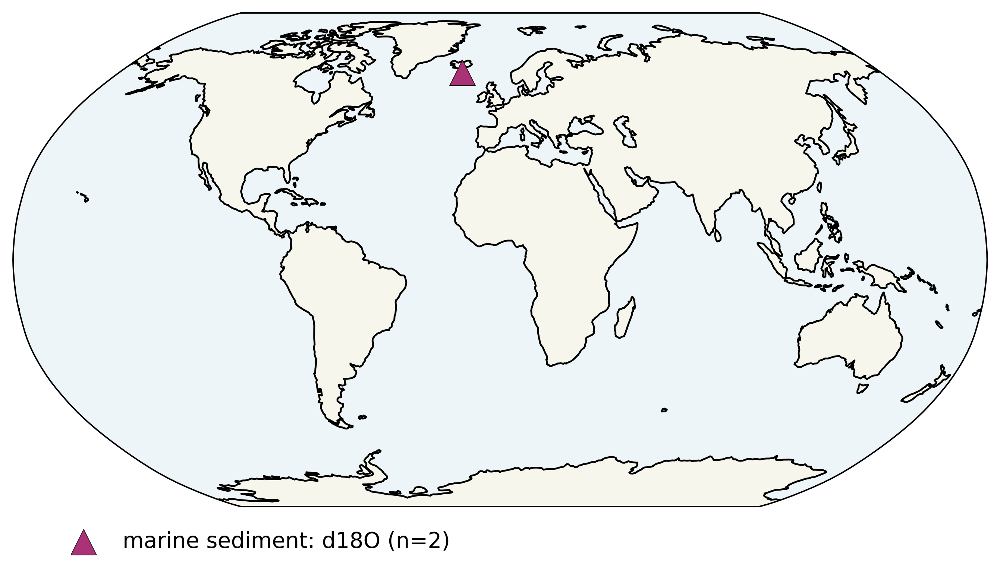

In [58]:
# (1) filter for archiveType and/or paleoData_proxy: 
at  = 'marine sediment'
pt  = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key, mincount=2)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

In [59]:
#========================= PROXY SPECIFIC=========================
minres    = 200                         # homogenised resolution
mny       = 000                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([200, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
#df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
#fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
#fan.plot_resolution(df_proxy, key)
#fan.plot_length(df_proxy, key)

#n_recs = len(df_proxy) # final number of records


#print(df_proxy[['miny', 'maxy', 'originalDatabase']])

#pca_rec[key] = df_proxy['datasetId']

Keep 0 records with nyears>=200 during 0-2000. Exclude 2 records.


In [60]:
# add 'z-scores' to dataframe and plot z-scores and values
#df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)

### homogenise data dimensions across the records

In [61]:
# define new homogenised time coordinate
#df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
#time[key] = years_hom


In [62]:
# assign the paleoData_values to the non-missing values in the homogenised data array

#out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
#paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
#new_columns = {'year_hom': [years_hom]*n_recs, 
#               'year_hom_avbl': year_hom_avbl, 
#               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
#               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
#               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
#df_proxy = df_proxy.assign(**new_columns)

#print('Real intersect after homogenising resolution: ')
#intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
#                             data='paleoData_zscores_hom_avbl')

#data[key] = paleoData_zscores_hom


### PCA

In [63]:
#covariance, overlap = fan.calc_covariance_matrix(df_proxy)

In [64]:
#eigenvalues, eigenvectors = fan.PCA(covariance)

#foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [65]:
#PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [66]:
print('Finished for %s'%key)

Finished for marine sediment_d18O


# summary figures

In [67]:
key_colour = {}
for key in keys:
    key_colour[key]=archive_colour[key.split('_')[0]]

key_colour['tree_d18O']='k'
print(set(df['archiveType']))
print(keys) # truncate keys to only those with valid PCAs
keys=['tree_TRW', 'tree_d18O', 'speleothem_d18O', 'lake sediment_d18O+d2H']
print(keys)

{'lake sediment', 'coral', 'terrestrial sediment', 'tree', 'mollusk shells', 'glacier ice', 'marine sediment', 'speleothem'}
['tree_TRW', 'tree_d18O', 'coral_d18O', 'speleothem_d18O', 'lake sediment_d18O+d2H', 'marine sediment_d18O']
['tree_TRW', 'tree_d18O', 'speleothem_d18O', 'lake sediment_d18O+d2H']


## mean z-score

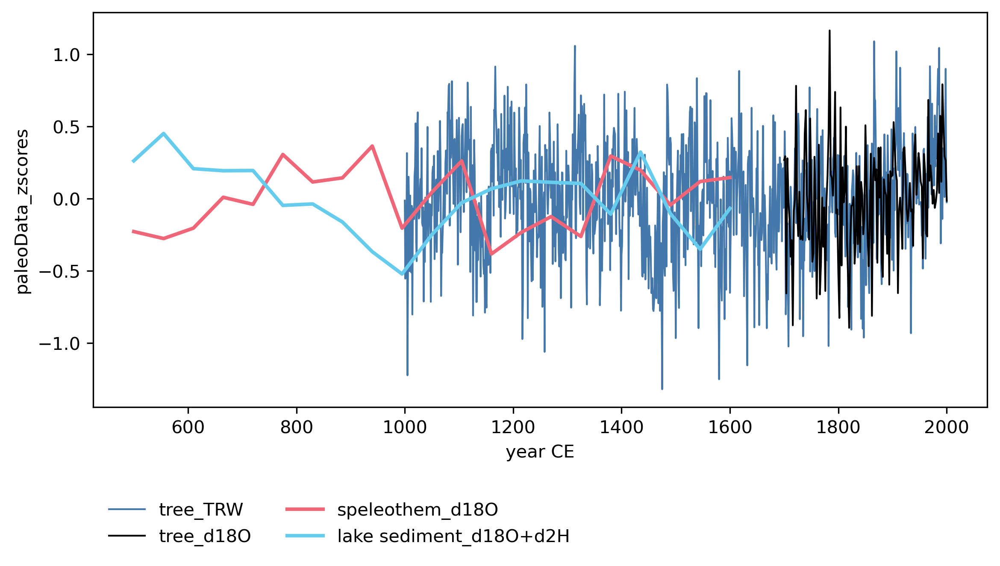

In [68]:
# as a comparison plot the mean over all records
fig = plt.figure(figsize=(9, 4), dpi=300)
for key in keys:
    lw = 1 if key in ['tree_TRW', 'tree_d18O'] else 2 # not: 'coral_d18O'
    plt.plot(time[key], np.ma.mean(data[key], axis=0)-np.mean(np.ma.mean(data[key], axis=0)), 
             label=key, lw=lw, color=key_colour[key])
plt.ylabel('paleoData_zscores')
plt.xlabel('year CE')
plt.legend(ncol=2, bbox_to_anchor=(0,-0.2), loc='upper left', framealpha=0)
plt.show()

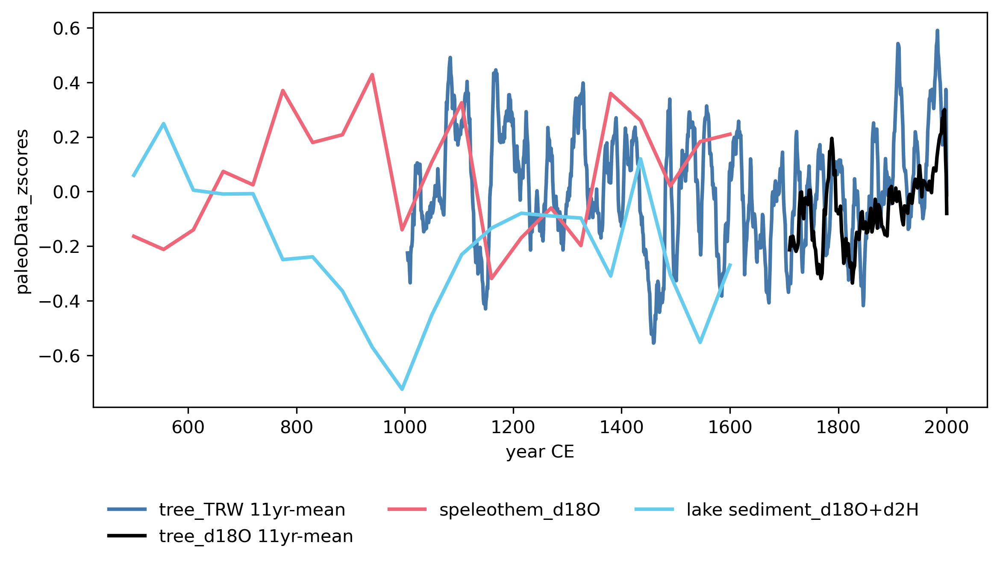

In [69]:
# as a comparison plot the mean over all records SMOOTHED
fig = plt.figure(figsize=(9, 4), dpi=300)
for key in keys:
    if key in ['tree_TRW', 'tree_d18O']: # not: , 'coral_d18O'
        tt, dd = fan.smooth(np.ma.mean(data[key], axis=0), time[key], 11)
        label=key+' 11yr-mean'
    else:
        tt, dd = time[key], np.ma.mean(data[key], axis=0)
        label=key
    plt.plot(tt, dd, label=label, lw=2, color=key_colour[key])
plt.ylabel('paleoData_zscores')
plt.xlabel('year CE')    
plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), loc='upper left', framealpha=0)
plt.show()

## Fraction of Explained Variance

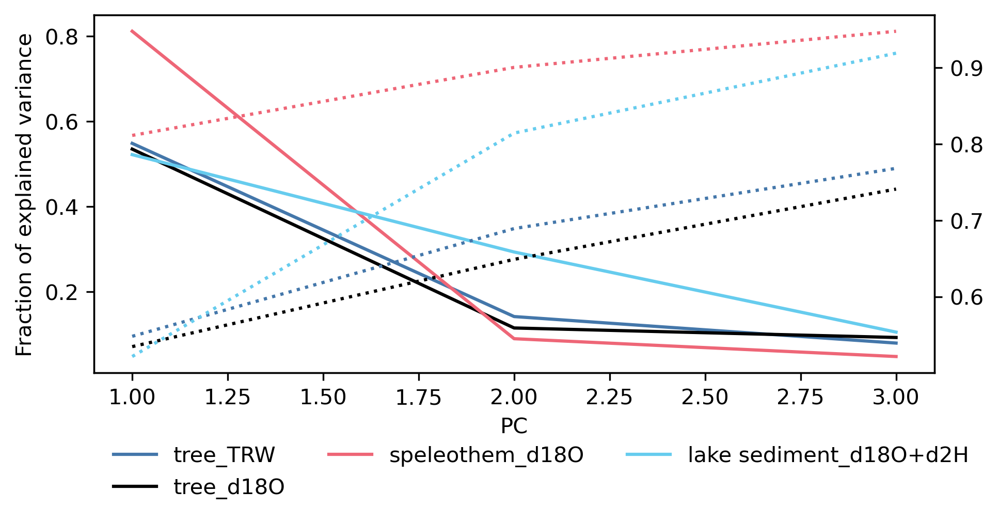

In [70]:
fig = plt.figure(figsize=(7,3), dpi=300)
ax  = plt.gca()
ax2 = ax.twinx()
for key in keys: # only for the first 4 eigenvalues
    ax.plot(range(1,4), foev[key][:3], label=key, color=key_colour[key])
    ax2.plot(range(1,4), np.cumsum(foev[key][:3]), label=key, ls=':', color=key_colour[key])
ax.set_ylabel('Fraction of explained variance')
# ax2.set_ylabel('Cumulative fraction of explained variance')
ax.set_xlabel('PC')    
ax.legend(ncol=3, bbox_to_anchor=(0,-0.15), loc='upper left', framealpha=0)

## 1st and 2nd PC

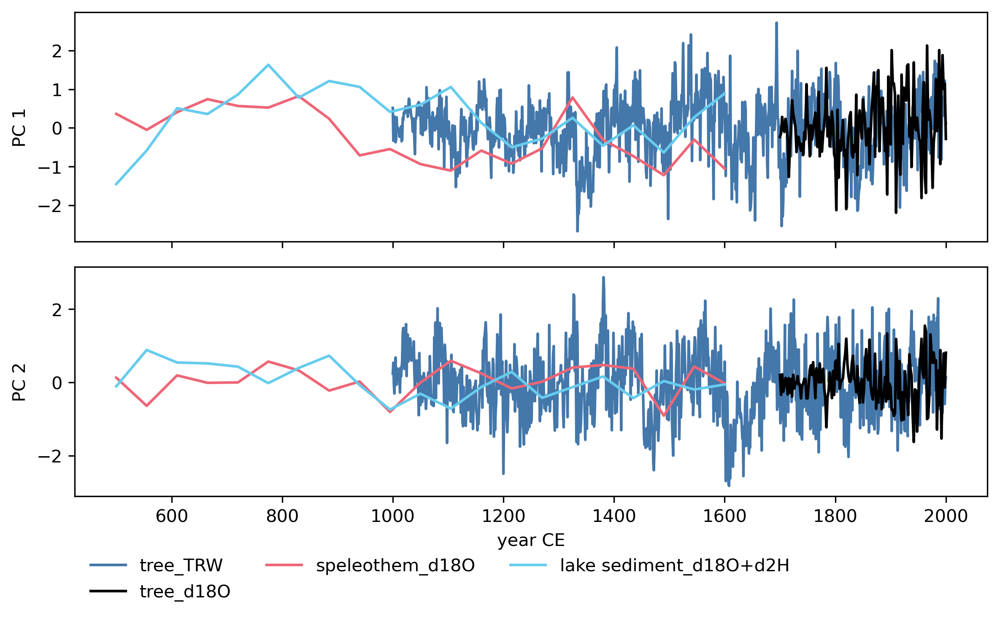

In [71]:
# plot PCs of different proxy types on the same axis. 
# Note that these are plotted as calculated in the respective analysis- NOT standardised differently!

fig = plt.figure(figsize=(8,5), dpi=300)

grid = GS(2,1)
for ii in range(2):
    ax = plt.subplot(grid[ii,:])
    for key in keys:
        a=1 if key in ['tree_TRW', 'speleothem_d18O', 'lake sediment_d18O+d2H'] else 1 # no inverted PC plotting
        plt.plot(time[key], a*PCs[key][ii], label=key, color=key_colour[key])
    if ii==0: 
        ax.axes.xaxis.set_ticklabels([])
    plt.ylabel('PC %d'%(ii+1)) 
plt.xlabel('year CE')

plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), 
           loc='upper left', framealpha=0)
grid.tight_layout(fig)



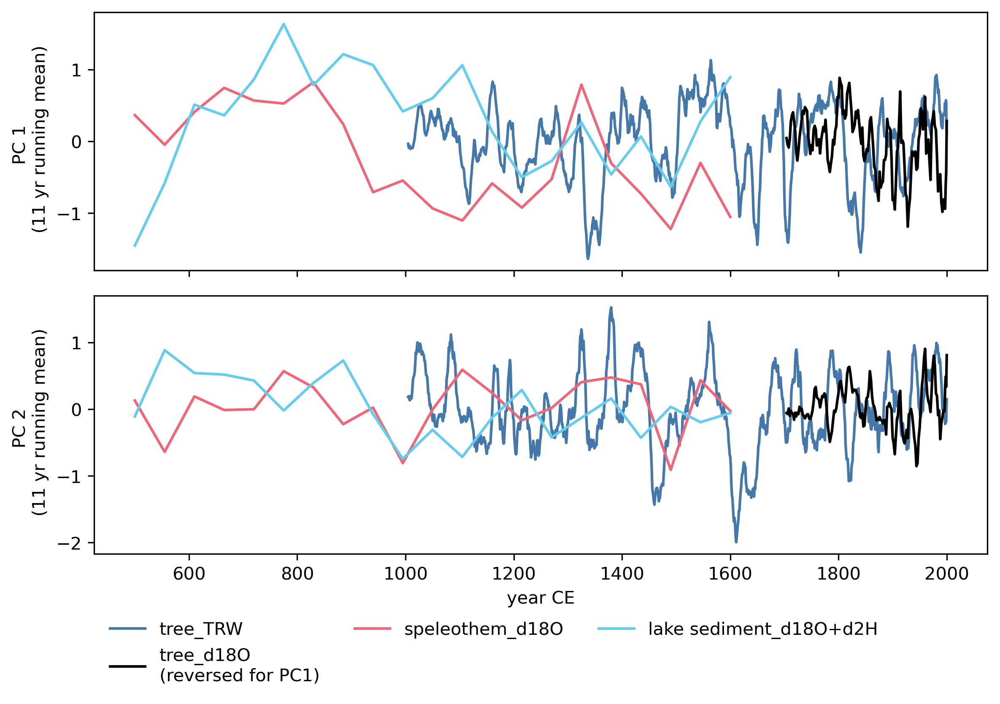

In [72]:
# plot PCs of different proxy types on the same axis. 
# SMOOTHED VIA 11YEAR RUNNING MEAN
fig = plt.figure(figsize=(8,5), dpi=300)

grid = GS(2,1)
for ii in range(2):
    ax = plt.subplot(grid[ii,:])
    for key in keys:
        label = key
        if ((key in ['tree_d18O', 'coral_d18O']) and (ii==0)):
            a = -1 
            label+= '\n(reversed for PC1)'
        else:
            a = 1
        resolution = np.unique(np.diff(time[key]))[0]
        if key in ['tree_TRW', 'tree_d18O', 'coral_d18O']:
            smooth = 11
            tt, dd = fan.smooth(PCs[key][ii], time[key], int(smooth/resolution))
            # label+=' %d-yr mean'%smooth
        else:
            tt, dd = time[key], PCs[key][ii]
        plt.plot(tt, a*np.array(dd), label=label, color=key_colour[key])
        
    plt.ylabel('PC %d \n (%d yr running mean)'%(ii+1, smooth))
    if ii==0: 
        ax.axes.xaxis.set_ticklabels([])
        hh, ll = ax.get_legend_handles_labels()
plt.xlabel('year CE')

grid.tight_layout(fig)

plt.legend(hh, ll, ncol=3, bbox_to_anchor=(0,-0.2), 
           loc='upper left', framealpha=0)
plt.show()


## 1st and 2nd EOF

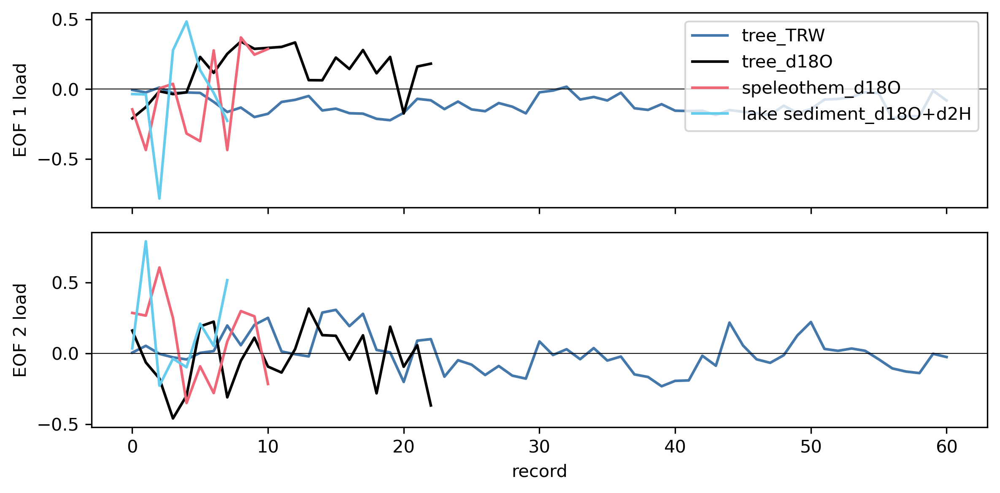

In [73]:

fig = plt.figure(figsize=(8,4), dpi=300)

grid = GS(2,1)
for key in keys:
    n_recs = data[key].shape[0]
    for ii in range(2):
        ax = plt.subplot(grid[ii,:])
        plt.plot(range(n_recs), EOFs[key][ii], label=key, color=key_colour[key])
        if ii==1: plt.xlabel('record')
        plt.ylabel('EOF %d load'%(ii+1))
        plt.axhline(0, color='k', alpha=0.5, lw=0.5)
        if ii==0: 
            ax.axes.xaxis.set_ticklabels([])
        if ii==0: plt.legend()
grid.tight_layout(fig)

## spatial EOF load

{'tree_TRW': 1, 'tree_d18O': -1, 'speleothem_d18O': 1, 'lake sediment_d18O+d2H': 1}
-0.6
0.6
saved figure in /dod2k_dupfree_dupfree_M/figs///M_spatial_EOF.pdf


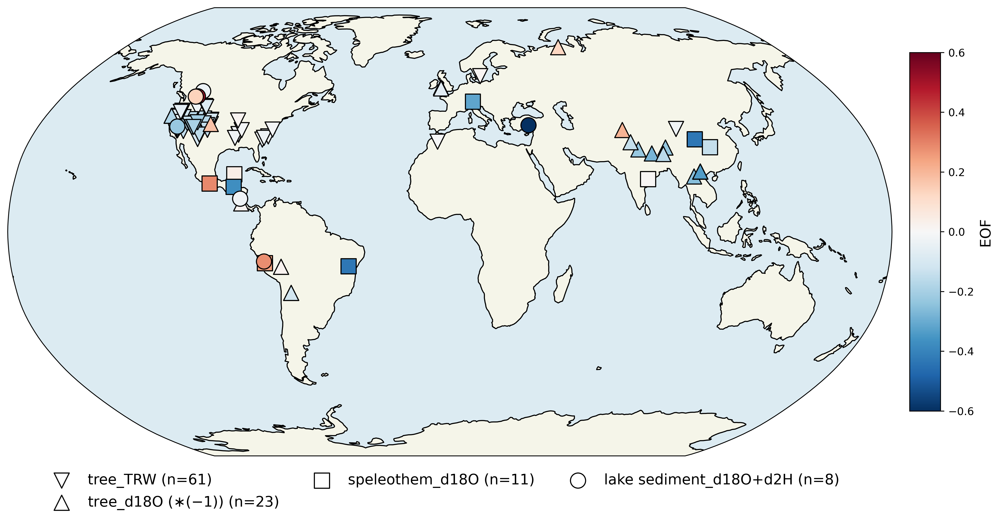

In [74]:
fig = fan.geo_EOF_plot(df, pca_rec, EOFs, keys)

f.figsave(fig, 'M_spatial_EOF', addfigs='/%s/figs/'%df.name)

saved figure in /dod2k_dupfree_dupfree_M/figs///M_PCA.pdf


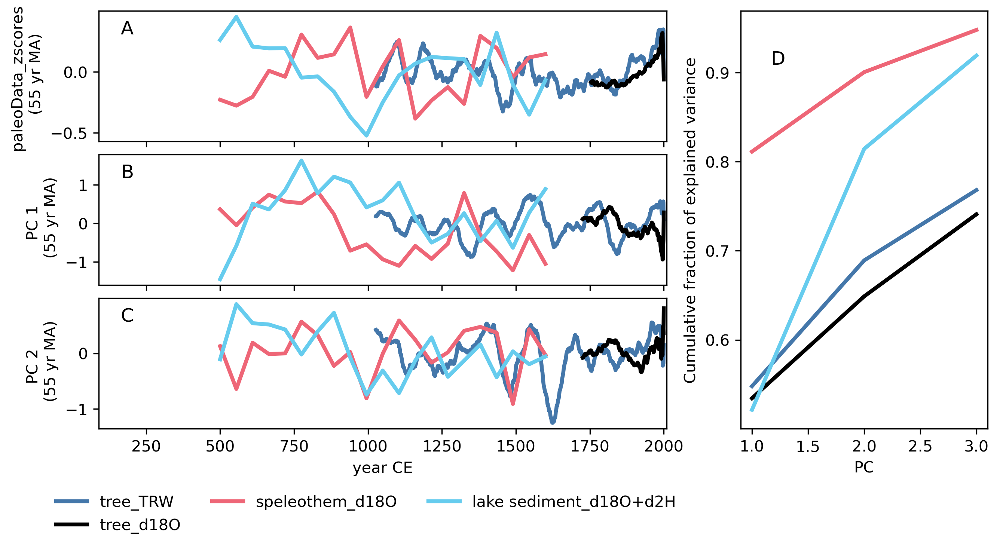

In [75]:
# as a comparison plot the mean over all records SMOOTHED
fig = plt.figure(figsize=(9, 5), dpi=300)

grid = GS(3,3)

smooth = 55#11

for key in keys:
    label = key
    resolution = np.unique(np.diff(time[key]))[0]
    # print(resolution, smooth, int(smooth/resolution))

    if resolution<smooth:
        tt, dd = fan.smooth(np.ma.mean(data[key], axis=0), time[key], smooth)
    else:
        tt, dd = time[key], np.ma.mean(data[key], axis=0)
        
    ax = plt.subplot(grid[0,:-1])
    plt.plot(tt, dd-np.mean(dd), label=label, lw=2.5, color=key_colour[key])
    plt.ylabel('paleoData_zscores \n (%d yr MA)'%(smooth))
    ax.axes.xaxis.set_ticklabels([])
    plt.title('A', x=0.05, y=0.75)
    plt.xlim(90, 2010)
    
    for ii in range(2):
        ax = plt.subplot(grid[ii+1,:-1])
        if ((key in ['tree_d18O', 'coral_d18O']) and (ii==0)):
            a = -1 
        else:
            a = 1
        if resolution<smooth:
            tt, dd = fan.smooth(PCs[key][ii], time[key], int(smooth/resolution))
        else:
            tt, dd = time[key], PCs[key][ii]
        plt.plot(tt, a*np.array(dd), label=label, color=key_colour[key], lw=2.5)
        
        plt.ylabel('PC %d \n (%d yr MA)'%(ii+1, smooth))
        if ii==0: 
            ax.axes.xaxis.set_ticklabels([])
        plt.title('BC'[ii], x=0.05, y=0.75)
        plt.xlim(90, 2010)
plt.xlabel('year CE')



plt.legend(ncol=3, bbox_to_anchor=(-0.1,-0.4), 
           loc='upper left', framealpha=0)


ax=plt.subplot(grid[:,-1])
ax  = plt.gca()
# ax2 = ax.twinx()
for key in keys:
    # ax.plot(range(1,9), foev[key][:8], label=key, color=key_colour[key])
    ax.plot(range(1,4), np.cumsum(foev[key][:3]), label=key, color=key_colour[key], lw=2.5)
ax.set_ylabel('Cumulative fraction of explained variance')
ax.set_xlabel('PC')    
ax.set_xlim(.9,3.1)
plt.title('D', x=0.15, y=0.85)

grid.tight_layout(fig)
grid.update(hspace=0.1,wspace=0.3)

f.figsave(fig, 'M_PCA', addfigs='/%s/figs/'%df.name)